# Import Core Libraries

In [26]:
import pandas as pd
import numpy as np

#VIZUALIZATION MODULES
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import plotly.graph_objects as go
import plotly.express as px
import plotly
from plotly.subplots import make_subplots
from scipy.stats import norm

INPUT = '\33[34m'
RESULT = '\33[32m'
CEND = '\033[0m'

# Enter ticker for analysis.

In [2]:
inputs = []
input1 = input(INPUT+ 'Enter a ticker you wish to analyze. If done, press enter without entering a ticker.' + CEND + '\n\nSelected:')


Enter a ticker you wish to analyze. If done, press enter without entering a ticker.

Selected:AAPL


# Get historical data.
Use the following code IF you are using IEX Cloud as the source of your Data

In [3]:
##Front end user can look up IEX documentation
#print('\nClick here for time frame options:\n\nhttps://iexcloud.io/docs/api/#historical-prices')
#time_frame = input("ENTER a Time Frame.\n\nSelected:    ")
#ticker = input1
#token = 'Tpk_170ff477f7c148849ac1611015e393e7' #Can be switched for real public token
#historical = time_frame
#data = 'https://sandbox.iexapis.com/stable/stock/'+ ticker + '/chart/'+ historical +'?token='+ token
#df = pd.read_json(data)
#df = df[['date','open','close','high','low','volume']]
#df.set_index('date',inplace =True)
#df.head()

Use the following code IF you are using Pandas DataReader as the source of your data.

In [4]:
# USE THE BELOW CODE FOR PANDAS DATA READER
from pandas_datareader import data as wb
import datetime
from datetime import datetime, timedelta

# GET START AND END DATE FROM USER
years = int(input("How many years of data would you like?\n\nYou selected:  "))
start = datetime.today() - timedelta(days= years *365)
end = datetime.today()

ticker = input1
df = wb.DataReader(ticker,'yahoo',start, end)
df = df.rename(columns={'High': 'high', 'Low': 'low', 'Open': 'open', 'Close': 'uclose' ,'Adj Close': 'close', 'Volume':'volume'})
df

/opt/anaconda3/lib/python3.7/site-packages/pandas_datareader/compat/__init__.py:7: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  from pandas.util.testing import assert_frame_equal


How many years of data would you like?

You selected:  4


,high,low,open,uclose,volume,close
Date,,,,,,
2016-09-09,26.430000,25.782499,26.160000,25.782499,186228000.0,24.335394
2016-09-12,26.430000,25.632500,25.662500,26.360001,181171200.0,24.880482
2016-09-13,27.197500,26.809999,26.877501,26.987499,248704800.0,25.472759
2016-09-14,28.257500,27.150000,27.182501,27.942499,443554800.0,26.374159
2016-09-15,28.932501,28.372499,28.465000,28.892500,359934400.0,27.270836
...,...,...,...,...,...,...
2020-08-31,131.000000,126.000000,127.580002,129.039993,225702700.0,129.039993
2020-09-01,134.800003,130.529999,132.759995,134.179993,152470100.0,134.179993
2020-09-02,137.979996,127.000000,137.589996,131.399994,200119000.0,131.399994


# Create Technical Indicators

In [5]:
df['MA50'] = df['close'].rolling(window=50).mean()
df['MA100'] = df['close'].rolling(window=100).mean()
df['MA200'] = df['close'].rolling(window=200).mean()
df['EWMA50'] = df['close'].ewm(span=50).mean()
df['EWMA100'] = df['close'].ewm(span=100).mean()
df['EWMA200'] = df['close'].ewm(span=200).mean()
rolling_20 = df['close'].rolling(window=20).mean()
rolling_20_std = df['close'].rolling(window=20).std()
upper_band = rolling_20 + (rolling_20_std*1.5)
lower_band = rolling_20 - (rolling_20_std*1.5)

# Plot Technical indicators
  - 1) SMA
  - 2) EWMA
  - 3) Unadjusted Candlestick
  - 4) Adjusted Candlestick with Bollinger Bands

In [6]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

fig = make_subplots(rows=2, cols=1, 
                    shared_xaxes=True, 
                    vertical_spacing=0.02)

fig = make_subplots(rows=2, cols=1, 
                    shared_xaxes=True, 
                    vertical_spacing=0.02,
                    row_heights=[0.7, 0.3])
fig.add_trace(go.Scatter(x=df.index, y=df['close'], line=dict(color = 'black', width=1), name = 'Adj Close'),row=1, col=1)
fig.add_trace(go.Scatter(x=df.index, y=df['MA50'], line=dict(color = '#00b294', width=2), name = 'SMA-50'),row=1, col=1)
fig.add_trace(go.Scatter(x=df.index, y=df['MA100'], line=dict(color = '#ff8c00', width=2), name = 'SMA-100'),row=1, col=1)       
fig.add_trace(go.Scatter(x=df.index, y=df['MA200'], line=dict(color = '#e81123', width=2), name = 'SMA-200'),row=1, col=1)

fig.add_trace(go.Bar(x=df.index, y=df['volume'],name = 'Volume'),row=2, col=1)
fig.update_traces(marker_color='black', marker_line_color='black',
                  marker_line_width=1.5, opacity=0.6)


fig.update_xaxes(title_font_family="Arial")
fig.update_yaxes(title_font_family="Arial")
fig.update_layout(

#Title if IEX
    # title= ticker + ' ' + 'MOVING AVERAGES' + ' (' + time_frame.upper() + ')',
    
title = ticker + ' ' + ' MOVING AVERAGES - ' + str(years) + ' YEARS',
yaxis_title='Adjusted Price',
font=dict(
    family="Times New Roman",
    size=14,
    color="grey"),
xaxis=dict(
    type="date"    
    ),
legend=dict(
    yanchor="top",
    y=.999,
    xanchor="left",
    x=0.001),
)


fig.show()

In [27]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

fig = make_subplots(rows=2, cols=1, 
                    shared_xaxes=True, 
                    vertical_spacing=0.02,
                    row_heights=[0.7, 0.3])

fig.add_trace(go.Scatter(x=df.index, y=df['close'], line=dict(color = 'black', width=1), name = 'Adj Close'),row=1, col=1)
fig.add_trace(go.Scatter(x=df.index, y=df['EWMA50'], line=dict(color = '#68217a', width=2), name = 'EWMA-50'),row=1, col=1)
fig.add_trace(go.Scatter(x=df.index, y=df['EWMA100'], line=dict(color = '#00bcf2', width=2), name = 'EWMA-100'),row=1, col=1)       
fig.add_trace(go.Scatter(x=df.index, y=df['EWMA200'], line=dict(color = '#00ff52', width=2), name = 'EWMA-200'),row=1, col=1)

fig.add_trace(go.Bar(x=df.index, y=df['volume'],name = 'Volume'),row=2, col=1)
fig.update_traces(marker_color='black', marker_line_color='black',
                  marker_line_width=1.5, opacity=0.6)


fig.update_xaxes(title_font_family="Arial")
fig.update_yaxes(title_font_family="Arial")
fig.update_layout(

#Title if IEX
    # title= ticker + ' ' + 'EWMA' + ' (' + time_frame.upper() + ')',
    
title = ticker + ' ' + ' EW MOVING AVERAGES - ' + str(years) + ' YEARS',
yaxis_title='Adjusted Price',
font=dict(
    family="Times New Roman",
    size=14,
    color="grey"),
xaxis=dict(
    type="date"    
    ),
legend=dict(
    yanchor="top",
    y=.999,
    xanchor="left",
    x=0.001),
)


fig.show()

NameError: name 'trace' is not defined

In [8]:
del fig
fig = go.Figure(data=[go.Candlestick(x=df.index,
                open=df['open'], high=df['high'],
                low=df['low'], close=df['uclose'],name = 'Candle', increasing_line_color= 'green',decreasing_line_color= 'red')])
fig.update_xaxes(title_font_family="Arial")
fig.update_yaxes(title_font_family="Arial")
fig.update_layout(
#Title if IEX
    # title= ticker + ' ' + 'CANDLE' + ' (' + time_frame.upper() + ')',
    
title = ticker + ' ' + 'CANDLE - ' + str(years) + ' YEARS',
yaxis_title='Unadjusted Price',
font=dict(
    family="Times New Roman",
    size=14,
    color="grey"),
xaxis=dict(
    type="date"    
    ),
legend=dict(
    yanchor="top",
    y=.999,
    xanchor="left",
    x=0.001),
               )
fig.show()

In [9]:
del fig
fig = go.Figure(data=[go.Candlestick(x=df.index,
                open=df['open'], high=df['high'],
                low=df['low'], close=df['close'],name = 'Candle', increasing_line_color= 'green',decreasing_line_color= 'red')]
)

fig.add_trace(go.Scatter(x=df.index, y= lower_band,
    fill=None,
    mode='lines',
    line_color='black',
    name = 'Lower'
    ))
fig.add_trace(go.Scatter(
    x= df.index,
    y= upper_band,
    fill='tonexty', # fill area between trace0 and trace1
    mode='lines', line_color='black', name = 'Upper'))
fig.update_xaxes(title_font_family="Arial")
fig.update_yaxes(title_font_family="Arial")
fig.update_layout(
#Title if IEX
    # title= ticker + ' ' + 'CANDLE' + ' (' + time_frame.upper() + ')',   
title = ticker + ' ' + 'BOLLINGER BANDS - ' + str(years) + ' YEARS',
yaxis_title='Adjusted Price',
font=dict(
    family="Times New Roman",
    size=14,
    color="grey"),
    xaxis=dict(
        type="date"    
    ),
legend=dict(
    yanchor="top",
    y=.999,
    xanchor="left",
    x=0.001)
)

fig.show()

# Returns

Over the past 4 years, AAPL saw the following returns: 

Average Daily Return = 0.18%
Average Annual Return = 44.5%
Max Daily Return = 12.0%
Min Daily Return = -12.9%
Cumulative Return = 497.05%


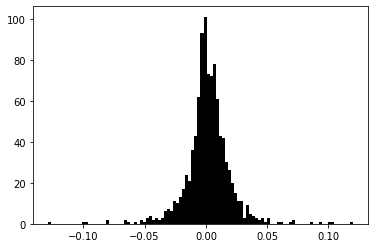

In [10]:
df['simple_return'] = (df['close']/df['close'].shift(1)) - 1
df['cumulative_return'] = (1 + df['simple_return']).cumprod()
avg_returns_d = df['simple_return'].mean()
avg_returns_a = df['simple_return'].mean()*250
max_returns_d = df['simple_return'].max()
min_returns_d = df['simple_return'].min()
# IEX  print('Over the '+ str(time_frame) + ' time frame' ', ' + ticker + ' saw the following returns: \n')
print('Over the past '+ str(years) + ' years' ', ' + ticker + ' saw the following returns: \n')
print('Average Daily Return = ' + RESULT + str(round(avg_returns_d,4)*100)+ '%'+ CEND)
print('Average Annual Return = ' + RESULT + str(round(avg_returns_a,4)*100)+ '%'+ CEND)
print('Max Daily Return = ' + RESULT + str(round(max_returns_d,3)*100)+ '%'+ CEND)
print('Min Daily Return = ' + RESULT + str(round(min_returns_d,3)*100)+ '%'+ CEND)
print('Cumulative Return = ' + RESULT + str(round(df['cumulative_return'].iloc[-1],4)*100)+ '%'+ CEND)

plt.hist(df['simple_return'].iloc[1:], bins=100, color = 'black')
plt.show()

# Monte Carlo Simulations

Set up simulation.

In [11]:
log_returns = np.log(1 + df['close'].pct_change())
mean = log_returns.mean()
print('Mean Log Daily Return = ' + str(round(mean,5)*100)+ '%')
var = log_returns.var()
print('Variance Log Daily Return = ' + str(round(var,4)*100)+ '%')
drift = mean - (.5 * var)
print('Drift = ' + str(round(drift,5)))
stdev = log_returns.std()
print('Standard Deviation = ' + str(round(stdev,5)))
np.array(drift)
np.array(stdev)

Mean Log Daily Return = 0.16%
Variance Log Daily Return = 0.04%
Drift = 0.00142
Standard Deviation = 0.01908


array(0.01907715)

Set up array for iterations and get daily return array.

In [12]:
time_intervals = int(input("How many days out would you like to simulate?\n\nSelected:     "))
iterations= int(input("How many models would you like to simulate?\n\nSelected:      "))

st_price = df['close'].iloc[-1]
daily_returns_f = np.exp(np.array(drift) + np.array(stdev) * norm.ppf(np.random.rand(time_intervals,iterations)))
price_list = np.zeros_like(daily_returns_f)
price_list[0] = st_price

How many days out would you like to simulate?

Selected:     100
How many models would you like to simulate?

Selected:      1000


Run the model and graph the iterations. 

In [28]:
for t in range(1,time_intervals):
    price_list[t] = price_list[t-1] * daily_returns_f[t]
    
monte_carlo = pd.DataFrame(data=price_list)
monte_carlo_average = monte_carlo.mean(axis =1)
monte_carlo_median = monte_carlo.median(axis =1)
fig = make_subplots(rows=1, cols=1, 
                    shared_xaxes=True, 
                    vertical_spacing=0.02)

for t in range(0,iterations):
    fig.add_trace(go.Scatter(x=monte_carlo.index, y= monte_carlo[t],
    name = 'Simulation ' + str(t),
    fill=None,
    mode='lines',
    ))
fig.add_trace(go.Scatter(x=monte_carlo.index, y = monte_carlo_average, name = 'Average',  line = dict(color='black', width=4, dash='dash'))),
fig.add_trace(go.Scatter(x=monte_carlo.index, y = monte_carlo_median, name = 'Average',  line = dict(color='black', width=4))),
fig.update_xaxes(title_font_family="Arial")
fig.update_yaxes(title_font_family="Arial")
fig.update_layout(
title= ticker + ' ' + 'Monte Carlo Simulation',
yaxis_title='Forecasted Price',
font=dict(
    family="Times New Roman",
    size=14,
    color="grey"),
)
        


fig.show()
monte_carlo_average.tail()

95    138.916767
96    139.044945
97    139.230743
98    139.433124
99    139.719506
dtype: float64

# Options Pricing

Black-Scholes Call and Put pricing

Non Dividend Paying Stock: 

In [14]:
def d1(stock_price_s,strike_price_k,risk_free_r,stdev,time_to_exp):
    return (np.log(stock_price_s/strike_price_k)+ (risk_free_r + stdev **2/2) * time_to_exp) / (stdev * np.sqrt(time_to_exp))
def d2(stock_price_s,strike_price_k,risk_free_r, stdev,time_option):
    return (np.log(stock_price_s/strike_price_k)+ (risk_free_r - stdev **2/2)*time_to_exp) / (stdev*np.sqrt(time_to_exp))

def BSMcall(stock_price_s,strike_price_k,risk_free_r, stdev,time_to_exp):
    return (stock_price_s * norm.cdf(d1(stock_price_s,strike_price_k,risk_free_r,stdev,time_to_exp)) - (strike_price_k * np.exp(- risk_free_r * time_to_exp)* norm.cdf(d2(stock_price_s,strike_price_k,risk_free_r, stdev,time_to_exp))))
def BSMput(stock_price_s,strike_price_k,risk_free_r, stdev,time_to_exp):
    return (strike_price_k * np.exp(- risk_free_r * time_to_exp)* norm.cdf(-d2(stock_price_s,strike_price_k,risk_free_r, stdev,time_to_exp))-(stock_price_s * norm.cdf(-d1(stock_price_s,strike_price_k,risk_free_r,stdev,time_to_exp))))

stock_price_s = df['close'].iloc[-1]
print('Current Price: $' + str(stock_price_s ))

stdev = log_returns.std() * 250 ** 0.5
stdev

strike_price_k = float(input("\nENTER the option strike price.\n\nK =    "))

risk_free_r = float(input("\nENTER the risk free rate in decimal format.\n\nrf =    "))

time_to_exp = float(input("\nENTER the expiration time frame in years.\n\nt =    "))

d1(stock_price_s,strike_price_k,risk_free_r, stdev,time_to_exp)

d2(stock_price_s,strike_price_k,risk_free_r, stdev,time_to_exp)

print('\nThe BSM prices the European call option at ' + RESULT +'$' + str(round(BSMcall(stock_price_s,strike_price_k,risk_free_r, stdev,time_to_exp),5))+ CEND)

print('\nThe BSM prices the European put option at ' + RESULT +'$' + str(round(BSMput(stock_price_s,strike_price_k,risk_free_r, stdev,time_to_exp),5))+CEND)


Current Price: $120.95999908447266

ENTER the option strike price.

K =    150

ENTER the risk free rate in decimal format.

rf =    .01

ENTER the expiration time frame in years.

t =    1

The BSM prices the European call option at $5.93448

The BSM prices the European put option at $33.48195



Dividend Paying Stock: 

In [15]:


def d1(stock_price_s,strike_price_k,risk_free_r,stdev,time_to_exp,div_rate):
    return (np.log(stock_price_s/strike_price_k)+ (risk_free_r - div_rate + stdev **2/2) * time_to_exp) / (stdev * np.sqrt(time_to_exp))
def d2(stock_price_s,strike_price_k,risk_free_r, stdev,time_option, div_rate):
    return (np.log(stock_price_s/strike_price_k)+ (risk_free_r - div_rate - stdev **2/2)*time_to_exp) / (stdev*np.sqrt(time_to_exp))

def BSMcall(stock_price_s,strike_price_k,risk_free_r, stdev,time_to_exp):
    return (stock_price_s * norm.cdf(d1(stock_price_s,strike_price_k,risk_free_r,stdev,time_to_exp,div_rate)) - (strike_price_k * np.exp(- risk_free_r * time_to_exp)* norm.cdf(d2(stock_price_s,strike_price_k,risk_free_r, stdev,time_to_exp,div_rate))))
def BSMput(stock_price_s,strike_price_k,risk_free_r, stdev,time_to_exp):
    return (strike_price_k * np.exp(- risk_free_r * time_to_exp)* norm.cdf(-d2(stock_price_s,strike_price_k,risk_free_r, stdev,time_to_exp,div_rate))-(stock_price_s * norm.cdf(-d1(stock_price_s,strike_price_k,risk_free_r,stdev,time_to_exp,div_rate))))

stock_price_s = df['close'].iloc[-1]
print('Current Price: $' + str(stock_price_s ))

stdev = log_returns.std() * 250 ** 0.5
stdev

strike_price_k = float(input("\nENTER the option strike price.\n\nK =    "))

risk_free_r = float(input("\nENTER the risk free rate in decimal format.\n\nrf =    "))

time_to_exp = float(input("\nENTER the expiration time frame in years.\n\nt =    "))

div_rate = float(input("\nENTER the continuous dividend rate.\n\nq =    "))

d1(stock_price_s,strike_price_k,risk_free_r, stdev,time_to_exp,div_rate)

d2(stock_price_s,strike_price_k,risk_free_r, stdev,time_to_exp,div_rate)

print('\nThe BSM prices the European call option at ' + RESULT +'$' + str(round(BSMcall(stock_price_s,strike_price_k,risk_free_r, stdev,time_to_exp),5))+ CEND)

print('\nThe BSM prices the European put option at ' + RESULT +'$' + str(round(BSMput(stock_price_s,strike_price_k,risk_free_r, stdev,time_to_exp),5))+ CEND)


Current Price: $120.95999908447266

ENTER the option strike price.

K =    250

ENTER the risk free rate in decimal format.

rf =    .01

ENTER the expiration time frame in years.

t =    .5

ENTER the continuous dividend rate.

q =    .025

The BSM prices the European call option at $0.00337

The BSM prices the European put option at $127.79649


Binomial Options Pricing Model

In [23]:
# http://janroman.dhis.org/stud/I2014/CRR/CRR.py
# Author: Victor Lopez Lopez,
# Group Members: Shedrack Lutembeka, Bo Yuan, Victor Lopez Lopez
# Binomial tree (Cox-Rox-Rubenstein) for American Option Valuation 

# Inspired on: 
# Binomial Tree for America and European options by Mehdi Bounouar
# Binomial Tree Option Valuation Cox, Ross, Rubinstein method by "www.quantandfinancial.com"

import numpy as np
    # Inputs
nodes = 1000#input("Enter number of binomial steps: ")           #number of steps
price_s = 450 #input("Enter the initial underlying asset price: ") #initial underlying asset price
risk_free_r = 0.05 #input("Enter the risk-free interest rate: ")        #risk-free interest rate
div_rate = 0.05
strike_k = 500 #input("Enter the option strike price: ")            #strike price
st_dev = 0.2 #input("Enter the volatility factor: ")              #volatility
t = 1.
def Binomial(nodes, price_s, strike_k, risk_free_r,div_rate, st_dev, t, PutCall):  
    delta = t/nodes 
    u = np.exp(st_dev*np.sqrt(delta))
    d = 1./u
    p = (np.exp((risk_free_r-div_rate)*delta)-d) / (u-d) 

    #Binomial price tree
    stockvalue = np.zeros((nodes+1,nodes+1))
    stockvalue[0,0] = price_s
    for i in range(1,nodes+1):
        stockvalue[i,0] = stockvalue[i-1,0]*u
        for j in range(1,i+1):
            stockvalue[i,j] = stockvalue[i-1,j-1]*d
    
    #option value at final node   
    optionvalue = np.zeros((nodes+1,nodes+1))
    for j in range(nodes+1):
        if PutCall=="Call": # Call
            optionvalue[nodes,j] = max(0, stockvalue[nodes,j]-strike_k)
        elif PutCall=="Put": #Put
            optionvalue[nodes,j] = max(0, strike_k-stockvalue[nodes,j])
    
    #backward calculation for option price    
    for i in range(nodes-1,-1,-1):
        for j in range(i+1):
                if PutCall=="Put":
                    optionvalue[i,j] = max(0, strike_k-stockvalue[i,j], np.exp(-risk_free_r*delta)*(p*optionvalue[i+1,j]+(1-p)*optionvalue[i+1,j+1]))
                elif PutCall=="Call":
                    optionvalue[i,j] = max(0, stockvalue[i,j]-strike_k, np.exp(-risk_free_r*delta)*(p*optionvalue[i+1,j]+(1-p)*optionvalue[i+1,j+1]))
    return optionvalue[0,0]


print ('The Binomial Option Pricing Model prices the CALL option at '+ RESULT +'$' + str(Binomial(nodes, price_s, strike_k, risk_free_r, div_rate, st_dev, t, PutCall="Call"))+CEND)

print ('The Binomial Option Pricing Model prices the PUT option at '+ RESULT  +'$' + str (Binomial(nodes, price_s, strike_k, risk_free_r, div_rate, st_dev, t, PutCall="Put"))+CEND)


The Binomial Option Pricing Model prices the CALL option at $17.207453204707182
The Binomial Option Pricing Model prices the PUT option at $65.71867433422075
